## Image Segmentation Reserch
#### Author: Bruno Luiz de Castro

This notebook is the result of a 3 month research project done by Bruno Luiz de Castro, student of PUC Minas and exchange student at ESIEE Paris

The research was done at ESIEE Paris, with the supervision of Professor Jean Cousty, and Felipe Belém

The goal of this research was to study the how classic segmantation methods behave and applied in the same image with different scales, and compare the results given how "close" they are to a hierarchical segmentation.

In [1]:
# inicialization from requirements.txt
! pip install -r requirements.txt

# import libraries
import os
import math
from enum import Enum
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
import imageio
from skimage.segmentation import felzenszwalb, mark_boundaries, random_walker
from skimage.color import label2rgb

# image segmentation dictionary
segmentations = {
    'church': [50, 250],
    'piramids': [25, 100],
    'arch': [50, 100],
    'river': [25, 100],
    'bridge': [20, 150],
    'moonlight': [10, 75],
    'peppers': [20, 75],
    'elephants': [50, 150],
    'bird': [100, 500],
    'astronauts': [50, 300],
    'bonzai': [10, 75],
    'moose': [75, 250],
    'people': [15, 80],
    'rocks': [10, 50],
    'statues': [20, 200],
    'indigenous': [25, 150],
    'jaguar': [20, 100],
    'street': [10, 100],
    'surf': [50, 250],
    'sculpture': [10, 100],
    'fishing': [100, 200],
    'shore': [50, 300],
    'wine': [10, 50],
    'duck': [10, 20],
    'boat': [50, 300]
}

class Classification(Enum):
    """Classification of the image segmentation"""
    NO_ERROR = 'no error (no displacements)'
    SMALL_DISPLACEMENTS = 'only small countour displacement errors (only small displacements)'
    FEW_DISPLACEMENTS = 'few large countour displacement errors (1-10 large displacements)'
    MANY_DISPLACEMENTS = 'many large countour displacement errors (>10 large displacements)'

### The Felzenszwalb Algorithm

The Felsenszwalb algorithm is a classic segmentation algorithm that uses a graph based approach to segment an image. The algorithm is based on the idea of a graph where each pixel is a node, and each node is connected to its neighbors. The weight of the edge between two nodes is the difference between the pixels. The algorithm then merges the nodes with the lowest weight until a certain threshold is reached.

The cell below contain some utility functions to help with the usage of the algorithm, and the following cell contains execution of the algorithm on a sample image.

In [2]:
# felzenszwalb util methods
def count_segments(segments):
    """
    Count the number of segments in the image
    """
    return len(np.unique(segments))

def smallest_segment_size(segments):
    """
    Return the size of the biggest segment
    """
    min = np.bincount(segments.flatten()).argmin()
    return np.bincount(segments.flatten())[min]

def biggest_segment_size(segments):
    """
    Return the size of the biggest segment
    """
    biggest = np.bincount(segments.flatten()).argmax()
    return np.bincount(segments.flatten())[biggest]

def binary_search(image, target, k=10, iter=10, best=0, error=math.inf):
    """
    Binary search for the target value
    """

    # computing the Felzenszwalb's
    segments = felzenszwalb(image,
                            scale = k,
                            sigma = 5,
                            min_size = 100)
    
    # counting the number of segments
    num_segments = count_segments(segments)

    # checks if the current value is the best one found so far
    if abs(num_segments - target) < error:
        best = k
        error = abs(num_segments - target)

    if num_segments == target or iter == 0:
        # base case, return the best value found
        return round(best)
    elif num_segments < target:
        # serch down
        return binary_search(image, target, k*0.75, iter-1, best, error)
    else:
        # search up
        return binary_search(image, target, k*2, iter-1, best, error)
    
def plot_K_vs_segments(image, interval=(1, 1000, 25)):
    x = [i for i in range(*interval)]
    y = [count_segments(felzenszwalb(image, scale=i, sigma=5, min_size=10)) for i in x]

    plt.plot(x, y)
    plt.title('Number of segments vs K')
    plt.ylabel('Number of segments')

def plot_segmentations(image, segmentations, cmap=None, interval=(1, 1000, 25), kind='overlay'):
    aspect = (round((len(segmentations) + 2) / 2), 2)

    # Plotting the original image
    plt.figure(figsize=(15,10))
    plt.subplot(*aspect, 1)
    plt.title('Original Image')
    plt.imshow(image)

    plt.subplot(*aspect, 2)
    plot_K_vs_segments(image, interval=interval)

    for i in range(len(segmentations)):
        segmentation = felzenszwalb(image, scale=segmentations[i], sigma=5, min_size=100)
        segments = label2rgb(segmentation+1, image, alpha=1, kind=kind)
        # marking boundaries
        segmented_image = mark_boundaries(segments, segmentation, color=(0, 0, 0))
        caption = f'K = {str(segmentations[i])}, segments = {str(count_segments(segmentation))}'


        plt.subplot(*aspect, i+3)
        plt.title(caption)
        plt.imshow(segmented_image, cmap=cmap)

(321, 481, 3)


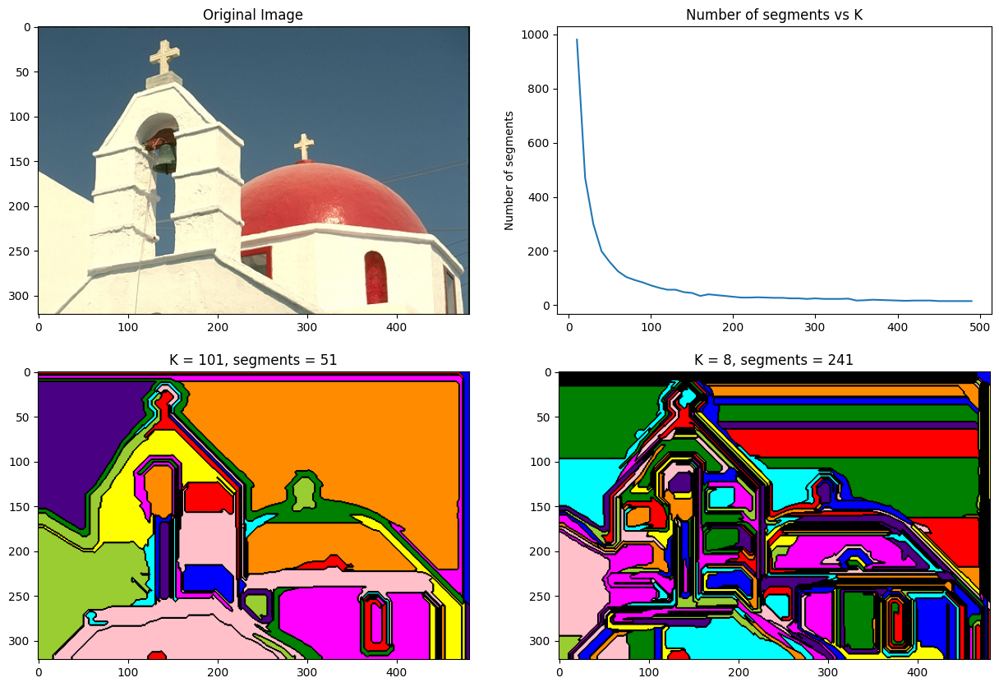

In [3]:
# felzenszwalb's demo

# loading the image
name = 'church'
image = np.array(Image.open(f'./images/orig/{name}.jpg'))
s = [binary_search(image, i, iter=10) for i in segmentations[name]]

plot_segmentations(image, s, interval=(10, 500, 10))

#### Binary Search explanation

The felzenszwalb algorithm uses a value K to determine the threshold of the algorithm. The higher the K, the fewer segments the algorithm will produce, and vice versa. Sadly, there is no method to directly find the desired K given a number of segments, so a binary search is used to find the K that produces a value closer to the desired one.

Note that, a value K that produces exactly the desired number of segments might not exist, so to avoid an infinite loop, the binary search will stop after a predefined number of iterations.

Alternitavely, the function plot_K_vs_segments can be used to plot the number of segments produced by the algorithm for each value of K, and the desired K can be chosen manually.

### Generating the all the images

In [5]:
# creating the felzenszwalb folder in images
! mkdir -p ./images/felzenszwalb

progress = 0
for tag in segmentations.keys():
    image = np.array(Image.open(f'./images/orig/{tag}.jpg'))
    s = [binary_search(image, i, iter=10) for i in segmentations[tag]]
    
    # creating the tag folder in images/felzenszwalb
    ! mkdir -p ./images/felzenszwalb/{tag}

    # progress bar
    progress += 1
    print(' ' * 100, end='\r')
    print(f'Processing {tag} image... ({progress}/{len(segmentations.keys())})',end='\r')

    for x in s:
        segmentation = felzenszwalb(image, scale=x, sigma=5, min_size=100)
        n_segs = count_segments(segmentation)
        im = Image.fromarray((segmentation * 255).astype(np.uint8))
        imageio.imwrite(f'./images/felzenszwalb/{tag}/{n_segs}.pgm', im)

print(' ' * 100, end='\r')
print('Done!')

Done!                                                                                               


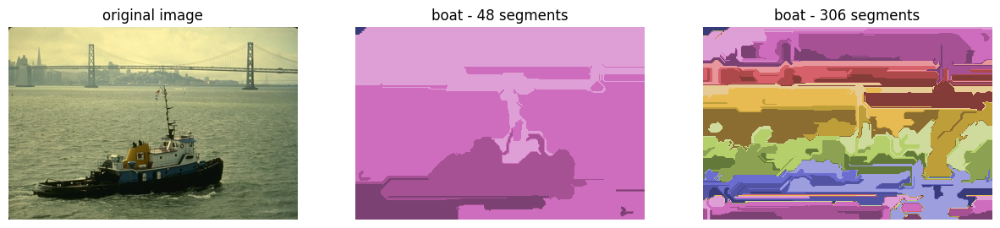

In [8]:
# visuzalizing the results
tag = 'boat'
files = os.listdir(f'./images/felzenszwalb/{tag}')
files.sort(key=lambda x: int(x.split('.')[0]))

a = plt.figure(figsize=(15,10))
plt.subplot(1, 3, 1)
image = np.array(Image.open(f'./images/orig/{tag}.jpg'))
plt.imshow(image, cmap='tab20b')
plt.title(f'original image')
plt.axis('off')

for file in files:
    plt.subplot(1, len(files)+1, files.index(file) + 2)
    image = np.array(Image.open(f'./images/felzenszwalb/{tag}/{file}'))
    plt.imshow(image, cmap='tab20b')
    plt.title(f'{tag} - {file.split(".")[0]} segments')
    plt.axis('off')


### The Sallience Map - Watershed (IFT) Method(s)

For the next studied algorithm, we used a combination of two classic methods: The Sallience Map and the Watershed algorithm.

The Sallience Map is a method that uses the gradient of the image to find the most important edges, and then uses the watershed algorithm to segment the image, using the IFT method.

After extracting the important edges, this result is inputed as 'seeds' in the watershed algorithm, which then segments the image.

The implemantation of both algorithms are implemented in C, so only h\the results are available in this notebook. They can be found under images/watershed

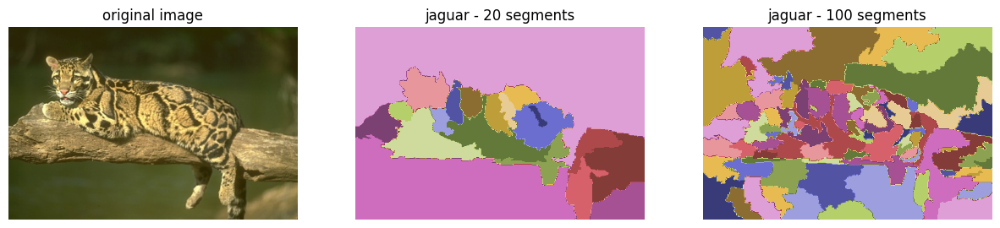

In [10]:
# visuzalizing the results
tag = 'jaguar'
files = os.listdir(f'./images/watershed/{tag}')
files.sort(key=lambda x: int(x.split('.')[0]))

a = plt.figure(figsize=(15,10))
plt.subplot(1, 3, 1)
image = np.array(Image.open(f'./images/orig/{tag}.jpg'))
plt.imshow(image, cmap='tab20b')
plt.title(f'original image')
plt.axis('off')

for file in files:
    plt.subplot(1, len(files)+1, files.index(file) + 2)
    image = np.array(Image.open(f'./images/watershed/{tag}/{file}'))
    plt.imshow(image, cmap='tab20b')
    plt.title(f'{tag} - {file.split(".")[0]} segments')
    plt.axis('off')


### Random Walker Method

The Random Walker method is a classic segmentation method that uses a graph based approach to segment an image. The algorithm is based on the idea of a graph where each pixel is a node, and each node is connected to its neighbors. The weight of the edge between two nodes is the difference between the pixels. The algorithm then merges the nodes with the lowest weight until a certain threshold is reached.

(-0.5, 480.5, 320.5, -0.5)

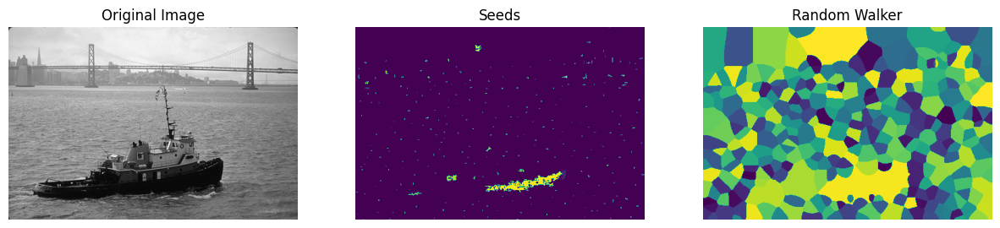

In [11]:
# random walker util methods

def read_seeds_file(path):
    """
    Read a seed file and return the seeds
    """

    with open(path, 'r') as file:
        shape = tuple(map(int, file.readline().split()[1:]))
        markers = np.zeros(shape, dtype=np.uint)

        for line in file.readlines():
            node = list(map(int, line.split()))
            markers[node[0]][node[1]] = node[2]

    return markers.T

# random walker's demo

# loading the image
path = './seeds/boat/300-seeds.txt'
seeds = read_seeds_file(path)

# reading image inn black and white
image = np.array(Image.open('./images/orig/boat.jpg').convert('L'))

# computing the random walker
labels = random_walker(image, seeds, beta=10, mode='bf')

# plotting the results
plt.figure(figsize=(15,10))
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(seeds)
plt.title('Seeds')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(labels)
plt.title('Random Walker')
plt.axis('off')

In [43]:
# generating images for random walker

# creating the rw folder in images
! mkdir -p ./images/rw

progress = 0

for tag in segmentations.keys():
    image = np.array(Image.open(f'./images/orig/{tag}.jpg').convert('L'))
    s = segmentations[tag]
    
    # creating the tag folder in images/felzenszwalb
    ! mkdir -p ./images/rw/{tag}

    # progress bar
    progress += 1
    print(' ' * 100, end='\r')
    print(f'Processing {tag} image... ({progress}/{len(segmentations.keys())})',end='\r')

    for x in s:
        path = f'./seeds/{tag}/{x}-seeds.txt'
        seeds = read_seeds_file(path)
        labels = random_walker(image, seeds, beta=10, mode='bf')
        im = Image.fromarray(labels.astype(np.uint8))
        imageio.imwrite(f'./images/rw/{tag}/{x}.pgm', im)

print(' ' * 100, end='\r')
print('Done!')

### The Hierarchical Segmentation Visualisation

In order to vizualise the quality of a segmentation, it was necessary to create a method to vizualise it well. The method implemented is declared in the cell below, and it is used in the following cells.

It's funtionality is simple: it takes two segmentations of two different scales, and overlap them in the image. Any borders in the lower scale one that don't match a border in the higher scale one gets a different coloration.

In [97]:
def read_images(name):
    """
    Read image from the file
    """
    images_f, images_w, images_rw = [], [], []
    
    files_f = os.listdir(f'images/felzenszwalb/{name}')
    files_w = os.listdir(f'images/watershed/{name}')
    files_rw = os.listdir(f'images/rw/{name}')

    # reading the felzenszwalb's segmentations
    for file in sorted(files_f, key=lambda x: int(x.split('.')[0])):
        images_f.append(np.array(Image.open(f'images/felzenszwalb/{name}/{file}')))

    # reading the watershed's segmentations
    for file in sorted(files_w, key=lambda x: int(x.split('.')[0])):
        images_w.append(np.array(Image.open(f'images/watershed/{name}/{file}')))

    for file in sorted(files_rw, key=lambda x: int(x.split('.')[0])):
        images_rw.append(np.array(Image.open(f'images/rw/{name}/{file}')))

    return images_f, images_w, images_rw

def display_row(images, titles, labels, save=None):
    """
    Display a row of images
    """
    n_col = len(titles)
    
    plt.figure(figsize=(20, 20))
    for i in range(n_col):
        plt.subplot(1, n_col, i + 1)
        plt.imshow(images[i], cmap='tab20b')
        plt.title(titles[i])
        plt.xlabel(labels[i])
        plt.xticks([])
        plt.yticks([])
        
    if save is not None:
        plt.savefig(save, bbox_inches='tight')
    else:
        plt.show()

    plt.close()

def display_orig_overlayed(orig, segs):
    """
    Display the original image overlayed with the segments
    """
    plt.figure(figsize=(20, 20))
    orig = label2rgb(segs, orig, bg_label=-1)
    plt.imshow(mark_boundaries(orig, segs, color=(1, 0, 0)))
    plt.axis('off')
    plt.show()

def highest_intersection(seg1, seg2):
    """
    Return an array with the largest intersection for each segment in seg1 in seg2
    """
    segments_1, segments_2 = np.unique(seg1), np.unique(seg2)

    if(len(segments_1) > len(segments_2)):
        raise('seg1 must be smaller than seg2')
    
    intersections = []

    for segment in segments_2:
        intersection = seg1[seg2 == segment]

        values = []
        # count the biggest intersection for each segment
        for group in np.unique(intersection):
            values.append((group, np.count_nonzero(intersection == group)))

        if values == []:
            continue

        biggest_intersection = max(values, key=lambda x: x[1])

        intersections.append(biggest_intersection[0])

    return intersections

def calculate_error(seg1, seg2):
    """
    Calculate the error between two segmentations
    """
    segments_1, segments_2 = np.unique(seg1), np.unique(seg2)

    if(len(segments_1) > len(segments_2)):
        raise('seg1 must be smaller than seg2')

    intersections = highest_intersection(seg1, seg2)

    errors = []
    for x, i in zip(segments_2, intersections):
        overlap = seg1[seg2 == x]

        error = 1 - (np.count_nonzero(overlap == i) / len(overlap))

        errors.append(error)

    return errors

def display_error(seg1, seg2, orig=None, errors=None):
    """
    Display the original image overlayed with the segments
    """
    plt.figure(figsize=(20, 20))

    image = np.zeros_like(seg1)

    if orig is None:
        boundaries_1 = mark_boundaries(np.zeros_like(seg2), seg2, color=(0, 0, 1))
        boundaries_2 = mark_boundaries(np.zeros_like(seg1), seg1, color=(1, 0, 0))
        image = boundaries_1 + boundaries_2

    else:
        image = label2rgb(seg2, orig, bg_label=-1, colors=[(error, 0, 0, 0) for error in errors], alpha=.9, image_alpha=1)
        image = mark_boundaries(image, seg1, color=(0, 0, 1))
        image = mark_boundaries(image, seg2, color=(0, 1, 0)) + 10 * image

    return image

def vizualize(name, classification, save=None):
    """
    Visualize the results
    """

    images_f, images_w, images_rw = read_images(name)
    orig_img = np.array(Image.open(f'images/orig/{name}.jpg'))

    # display_row(images, segs)
    # display_orig_overlayed(orig_img, images[i])

    error_f = calculate_error(*images_f)
    error_w = calculate_error(*images_w)
    error_rw = calculate_error(*images_rw)

    result_f = display_error(*images_f, orig_img, error_f)
    result_w = display_error(*images_w, orig_img, error_w)
    result_rw = display_error(*images_rw, orig_img, error_rw)

    labels = [classification['f'].value, classification['w'].value, classification['rw'].value]

    # display errors in row
    display_row([result_f, result_w, result_rw], ['Felzenszwalb', 'Watershed', 'Random Walker'], labels, save=save)

In [94]:
classification = {
    'church': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.SMALL_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'piramids': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.FEW_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'arch': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.FEW_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'river': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.SMALL_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'bridge': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.SMALL_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'moonlight': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.SMALL_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'peppers': {
        'f': Classification.FEW_DISPLACEMENTS,
        'w': Classification.SMALL_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'elephants': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.MANY_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'bird': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.MANY_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'astronauts': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.FEW_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'bonzai': {
        'f': Classification.FEW_DISPLACEMENTS,
        'w': Classification.SMALL_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'moose': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.FEW_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'people': {
        'f': Classification.FEW_DISPLACEMENTS,
        'w': Classification.FEW_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'rocks': {
        'f': Classification.FEW_DISPLACEMENTS,
        'w': Classification.SMALL_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'statues': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.FEW_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'indigenous': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.SMALL_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'jaguar': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.SMALL_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'street': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.SMALL_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'surf': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.MANY_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'sculpture': {
        'f': Classification.FEW_DISPLACEMENTS,
        'w': Classification.FEW_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'fishing': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.FEW_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'shore': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.FEW_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'wine': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.FEW_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'duck': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.FEW_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    },
    'boat': {
        'f': Classification.MANY_DISPLACEMENTS,
        'w': Classification.FEW_DISPLACEMENTS,
        'rw': Classification.MANY_DISPLACEMENTS
    }
}

In [ ]:
! mkdir -p ./images/results

for key in segmentations.keys(): vizualize(key, classification[key], save=f'./images/results/{key}.png')

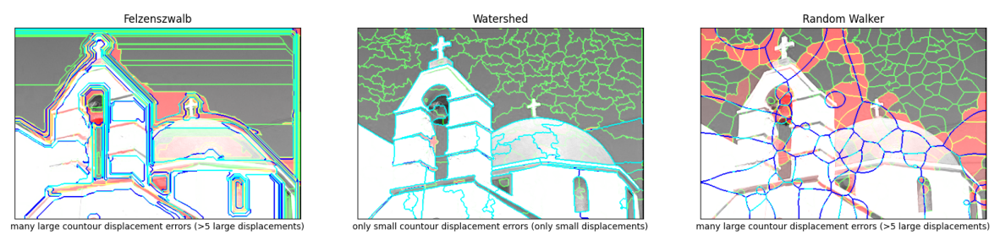

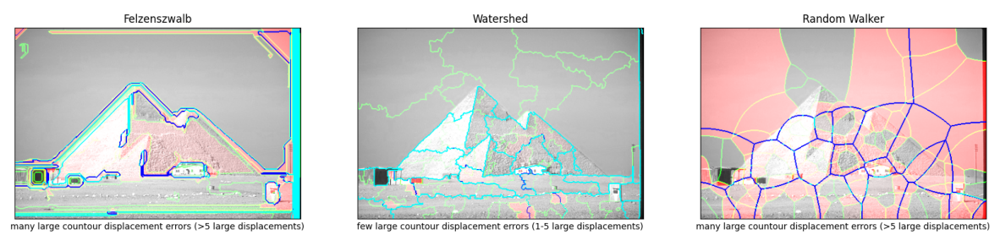

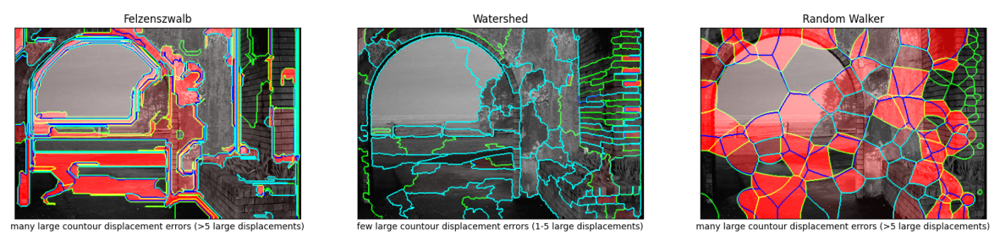

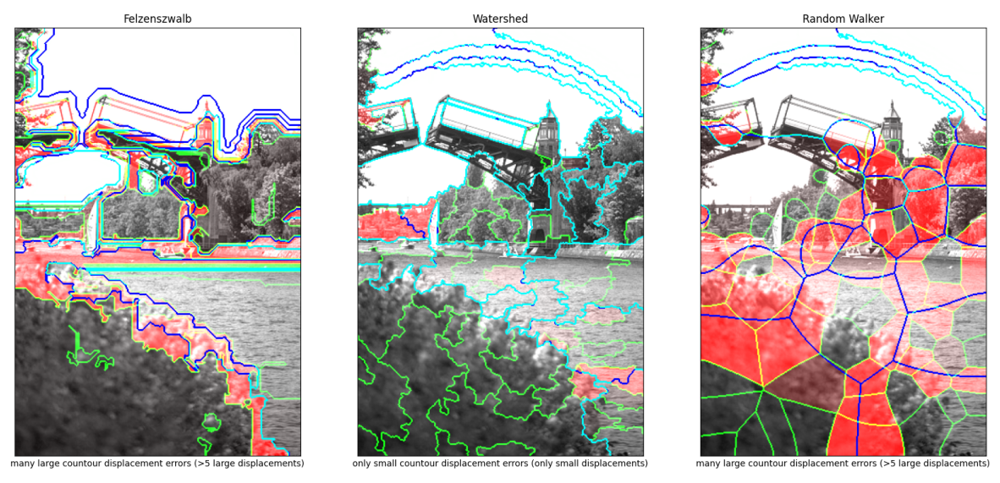

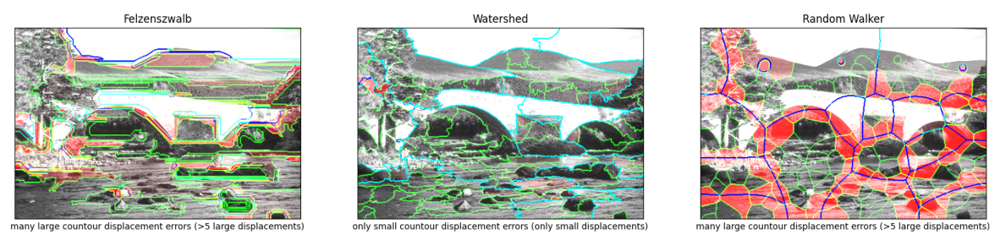

...

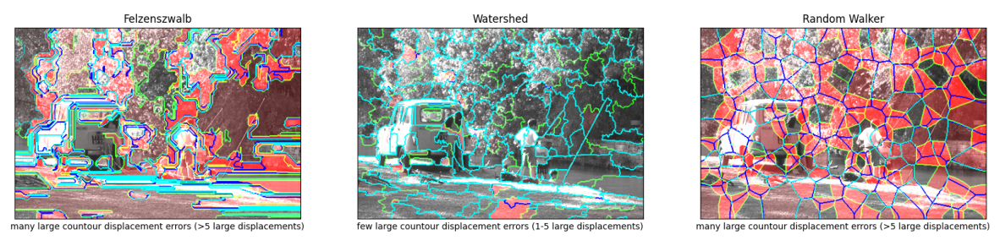

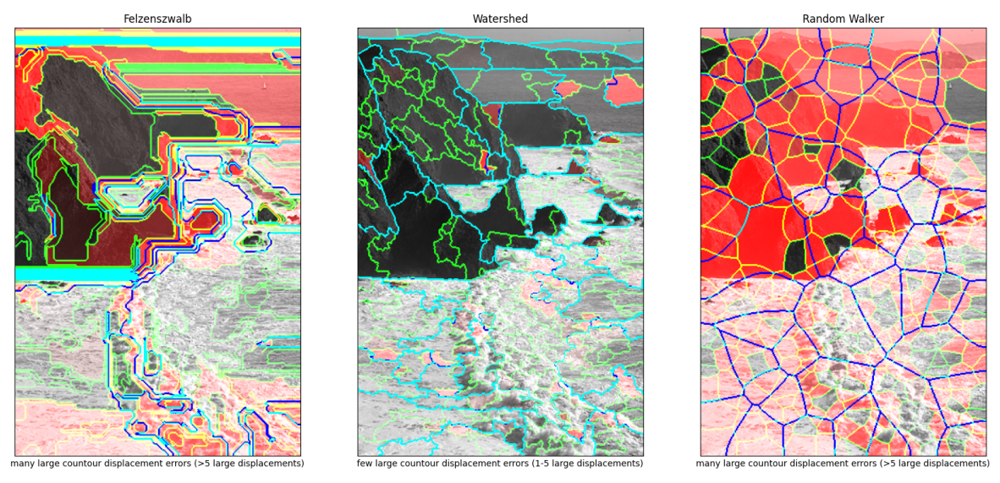

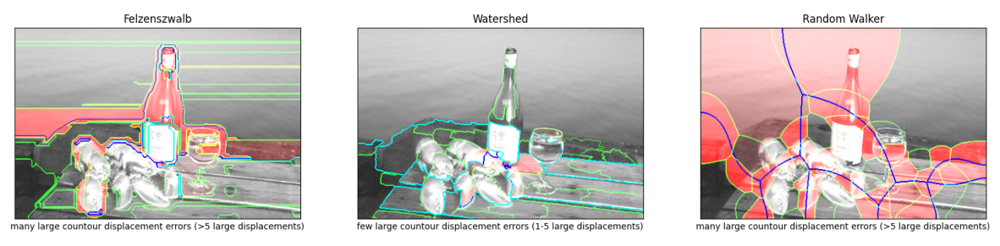

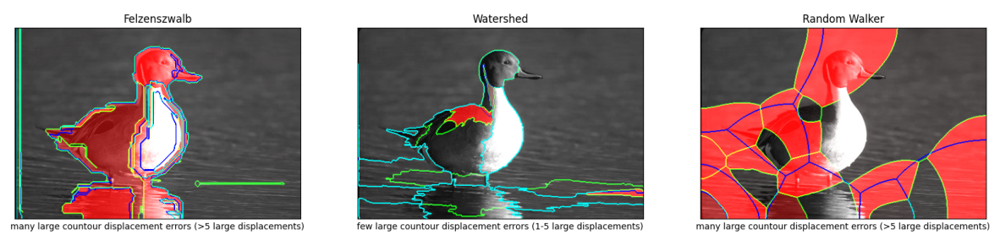

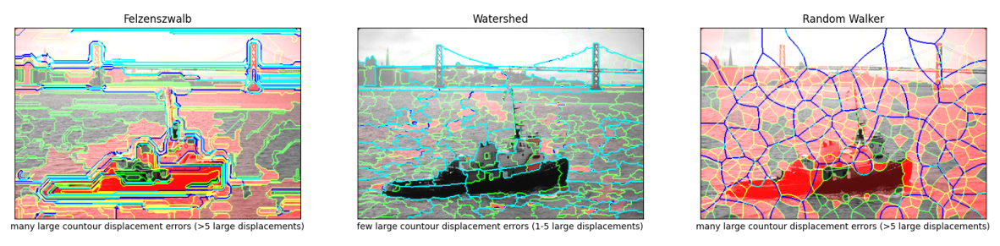

In [101]:
# show results
for key in segmentations.keys():
    image = np.array(Image.open(f'./images/results/{key}.png'))
    plt.figure(figsize=(15,10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()